In [1]:
import pandas as pd
import numpy as np
import sys
import math
import seaborn as sns
from matplotlib import pyplot as plt
import umap.umap_ as umap
import scipy.stats as stats
from tribus import run_tribus, heatmap_for_median_expression, marker_expression, umap_vis, z_score, marker_expression_by_cell_type
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import rand_score, accuracy_score, precision_score, f1_score

In [ ]:
# if save session
import dill
dill.dump_session('stellar_notebook_env.db')

In [ ]:
# restore session
import dill
dill.load_session('stellar_notebook_env.db')

## Process the dataset
- Use log2 for the channels (if needed)
- For each call/round of Tribus, perform always outlier truncation, set the maximum to the 99 or 95 percentile
- For each call/round of Tribus, perform always Z-score and then Min-Max transformation in all the channels

In [48]:
# read input files
# STELLAR_data_donor_004_upperlevel_CL.csv, contains only colon region
sample_data = pd.read_csv("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\origin_data\\B0056_unnanotated_dryad.csv", low_memory=False)
sample_data.columns.values

array(['Unnamed: 0', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f',
       'CD15', 'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin',
       'HLADR', 'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123',
       'CD38', 'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206',
       'CD68', 'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO',
       'Cytokeratin', 'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45',
       'CD56', 'CD69', 'Ki67', 'CD49a', 'CD163', 'CD161', 'x', 'y',
       'tissue', 'donor', 'unique_region'], dtype=object)

In [49]:
sample_data = sample_data.fillna(0)
sample_data

,Unnamed: 0,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,...,CD69,Ki67,CD49a,CD163,CD161,x,y,tissue,donor,unique_region
0,0-1,0.575289,-0.481011,0.654053,-0.250322,-0.116775,-0.379580,0.415840,-0.066525,-0.221217,...,-0.318008,-0.157021,-0.512286,-0.255888,-0.227428,8070.0,3667.0,CL,B005,reg001_CL_B005
1,3,-0.325875,0.472803,0.334144,-0.248955,-0.288774,0.109454,-0.257387,-0.066543,0.453602,...,-0.260681,-0.144769,-0.508026,-0.253587,-0.171000,6616.0,5029.0,CL,B005,reg001_CL_B005
2,5-1,0.321607,-0.238342,0.692836,-0.251649,-0.031736,0.939611,-0.228129,-0.066543,0.129779,...,-0.113831,-0.132310,-0.454669,-0.255114,-0.085918,4129.0,5082.0,CL,B005,reg001_CL_B005
3,6-1,-0.284582,-0.406741,0.097146,-0.218371,-0.196325,-0.054684,-0.255869,-0.066543,-0.447385,...,0.388212,-0.151367,-0.182111,-0.255032,-0.069185,5090.0,6769.0,CL,B005,reg001_CL_B005
4,7,-0.092258,0.425742,0.533254,-0.251649,-0.043627,1.845913,-0.257387,-0.066543,0.310604,...,-0.122201,-0.143644,-0.209669,-0.257411,-0.098228,4019.0,4722.0,CL,B005,reg001_CL_B005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619181,254552-2,-0.280306,-0.633781,0.148135,-0.228275,-0.341372,-0.196016,-0.074860,-0.091452,1.058399,...,2.655505,1.952473,-0.067391,0.292615,3.565615,3160.0,4911.0,SB,B005,reg004_SB_B005
619182,264152-2,-0.280311,-0.485198,0.118021,-0.222182,-0.266268,-0.096385,-0.077541,-0.091452,1.523380,...,3.152167,1.711874,0.220440,1.810482,1.997609,2732.0,3109.0,SB,B005,reg004_SB_B005
619183,267960-1,-0.280311,-0.724556,0.717393,-0.222505,-0.196720,-0.684421,-0.077923,-0.091543,3.958693,...,0.490143,2.935738,-0.468798,0.832112,7.559899,2888.0,4535.0,SB,B005,reg004_SB_B005
619184,278904,-0.280311,-0.642184,-0.095288,-0.256960,-0.341078,0.267545,-0.077923,-0.091543,3.843216,...,-0.494327,0.082192,-0.557536,-0.234320,1.428518,3222.0,1511.0,SB,B005,reg004_SB_B005


In [50]:
sample_data[['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']].describe()
# jump the log2 step...

,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,ITLN1,...,CD117,CD19,Podoplanin,CD45,CD56,CD69,Ki67,CD49a,CD163,CD161
count,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,...,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000,619186.000000
mean,0.009303,0.017841,-0.030697,-0.036037,-0.002273,-0.043728,-0.004267,-0.036001,-0.051756,-0.022550,...,-0.065333,-0.055395,-0.038233,-0.030860,-0.029969,-0.058585,-0.045964,-0.049002,-0.026468,-0.049456
std,1.019354,1.001924,0.869049,0.892550,0.991776,0.765006,1.008684,0.836670,0.640863,0.899885,...,0.671952,0.656286,0.816816,0.901443,0.897224,0.711125,0.801807,0.750699,0.924030,0.698173
min,-0.374729,-0.754423,-0.590521,-0.343851,-0.341372,-0.713857,-0.463499,-0.386302,-0.624550,-0.625216,...,-0.294533,-0.412365,-0.356496,-0.638753,-0.306671,-0.568071,-0.248521,-0.557536,-0.257411,-0.449670
25%,-0.280311,-0.555295,-0.358329,-0.286181,-0.303297,-0.536970,-0.161887,-0.144491,-0.305692,-0.384662,...,-0.261814,-0.249773,-0.309619,-0.460391,-0.281472,-0.330014,-0.166162,-0.423801,-0.244689,-0.273326
50%,-0.182518,-0.289541,-0.249802,-0.251649,-0.269534,-0.310923,-0.087709,-0.091134,-0.193631,-0.248888,...,-0.222146,-0.159646,-0.238545,-0.431648,-0.230731,-0.272669,-0.150204,-0.281576,-0.237820,-0.216887
75%,-0.164838,0.233224,-0.114147,-0.210332,-0.104628,0.158879,-0.076868,-0.066543,-0.030714,0.055787,...,-0.074870,-0.111919,-0.087796,-0.013885,-0.135263,-0.053904,-0.121476,-0.004389,-0.201651,-0.110343
max,51.511528,51.717945,39.890602,16.083230,33.619350,13.561556,74.842354,76.312386,96.631140,61.033530,...,36.096573,39.568920,37.267506,12.328763,32.606210,32.584183,37.336830,16.065939,23.191902,40.873478


In [51]:
#  perform always outlier truncation, set the maximum to the 99 percentile
cols = ['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']

Q = sample_data[cols].quantile(0.99)

sample_data_filtered = sample_data[~((sample_data[cols] > Q)).any(axis=1)]
print(np.shape(sample_data_filtered))
sample_data_filtered[cols].describe()

(456688, 54)


,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,ITLN1,...,CD117,CD19,Podoplanin,CD45,CD56,CD69,Ki67,CD49a,CD163,CD161
count,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,...,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000,456688.000000
mean,-0.065641,-0.074997,-0.126018,-0.140708,-0.116389,-0.118265,-0.081351,-0.095413,-0.101544,-0.118765,...,-0.138516,-0.123682,-0.123943,-0.172573,-0.123300,-0.164842,-0.118112,-0.119347,-0.124058,-0.134487
std,0.562812,0.676278,0.497544,0.520276,0.449167,0.580978,0.304677,0.110311,0.410846,0.484158,...,0.231315,0.316263,0.380367,0.623789,0.412746,0.386381,0.210155,0.515320,0.413603,0.346386
min,-0.374729,-0.754423,-0.590521,-0.343851,-0.341372,-0.713857,-0.463499,-0.386302,-0.624550,-0.625216,...,-0.294533,-0.412365,-0.356496,-0.638753,-0.306671,-0.568071,-0.248521,-0.557536,-0.257411,-0.449670
25%,-0.280311,-0.552751,-0.358455,-0.299597,-0.303297,-0.526180,-0.170862,-0.149394,-0.299956,-0.384662,...,-0.263531,-0.251648,-0.310238,-0.460391,-0.284396,-0.330521,-0.166162,-0.422641,-0.245481,-0.274794
50%,-0.182518,-0.297825,-0.251799,-0.254044,-0.275896,-0.313415,-0.090077,-0.091543,-0.195043,-0.262061,...,-0.228091,-0.161348,-0.244095,-0.433032,-0.233057,-0.284484,-0.153055,-0.289747,-0.238939,-0.228313
75%,-0.166015,0.177645,-0.136157,-0.229231,-0.151274,0.089527,-0.077535,-0.066543,-0.054456,0.004098,...,-0.101112,-0.119415,-0.123428,-0.178479,-0.163638,-0.122570,-0.129633,-0.039931,-0.216620,-0.132405
max,4.698544,3.585532,3.872603,4.716532,3.990679,2.983426,2.570063,1.234770,2.537799,3.179203,...,1.963100,3.023760,3.184572,3.550007,4.019176,2.988234,2.587520,3.339381,4.322006,2.794224


In [52]:
# For each call/round of Tribus 
# perform always Z-score and then Min-Max transformation in all the channels
# z-score
sample_data_scale = sample_data_filtered
cols = ['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']
sample_data_scale.loc[:,(cols)] = sample_data_scale[cols].apply(stats.zscore, nan_policy='omit')
# define min max scaler
scaler = MinMaxScaler()
sample_data_scale.loc[:,(cols)] = scaler.fit_transform(sample_data_scale[cols])
sample_data_scale

,Unnamed: 0,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,...,CD69,Ki67,CD49a,CD163,CD161,x,y,tissue,donor,unique_region
2,5-1,0.137256,0.118914,0.287547,0.018220,0.071476,0.447212,0.077589,0.197251,0.238535,...,0.127728,0.040976,0.026397,0.000502,0.112134,4129.0,5082.0,CL,B005,reg001_CL_B005
3,6-1,0.017769,0.080112,0.154077,0.024796,0.033482,0.178286,0.068444,0.197251,0.056023,...,0.268898,0.034257,0.096339,0.000520,0.117293,5090.0,6769.0,CL,B005,reg001_CL_B005
4,7,0.055678,0.271930,0.251791,0.018220,0.068731,0.692338,0.067944,0.197251,0.295715,...,0.125375,0.036980,0.089267,0.000000,0.108339,4019.0,4722.0,CL,B005,reg001_CL_B005
5,8-1,0.000000,0.022658,0.012907,0.018333,0.004612,0.124628,0.088051,0.197251,0.109162,...,0.068255,0.031893,0.007937,0.000260,0.068659,6016.0,6253.0,CL,B005,reg001_CL_B005
6,10-1,0.054360,0.106715,0.449991,0.018754,0.852676,0.367009,0.123176,0.197251,0.172392,...,0.080265,0.228916,0.128482,0.002654,0.096095,3447.0,7073.0,CL,B005,reg001_CL_B005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619149,191658-1,0.038179,0.040758,0.094514,0.000000,0.008789,0.085178,0.122283,0.141313,0.100792,...,0.066686,0.029150,0.045854,0.003865,0.041558,7822.0,7483.0,SB,B006,reg002_SB_B006
619150,247453-1,0.037887,0.041815,0.091402,0.000000,0.104168,0.108790,0.303091,0.174352,0.161562,...,0.095832,0.055631,0.093712,0.012170,0.198129,6549.0,7552.0,SB,B006,reg002_SB_B006
619151,264829-2,0.037887,0.040758,0.078986,0.006330,0.223159,0.085178,0.122283,0.134763,0.100260,...,0.098691,0.024392,0.033501,0.004486,0.103084,8050.0,6912.0,SB,B006,reg003_SB_B006
619152,271885-1,0.038008,0.040758,0.071069,0.000000,0.008789,0.085178,0.122283,0.158977,0.226695,...,0.066686,0.019775,0.033501,0.001693,0.048753,6927.0,7699.0,SB,B006,reg003_SB_B006


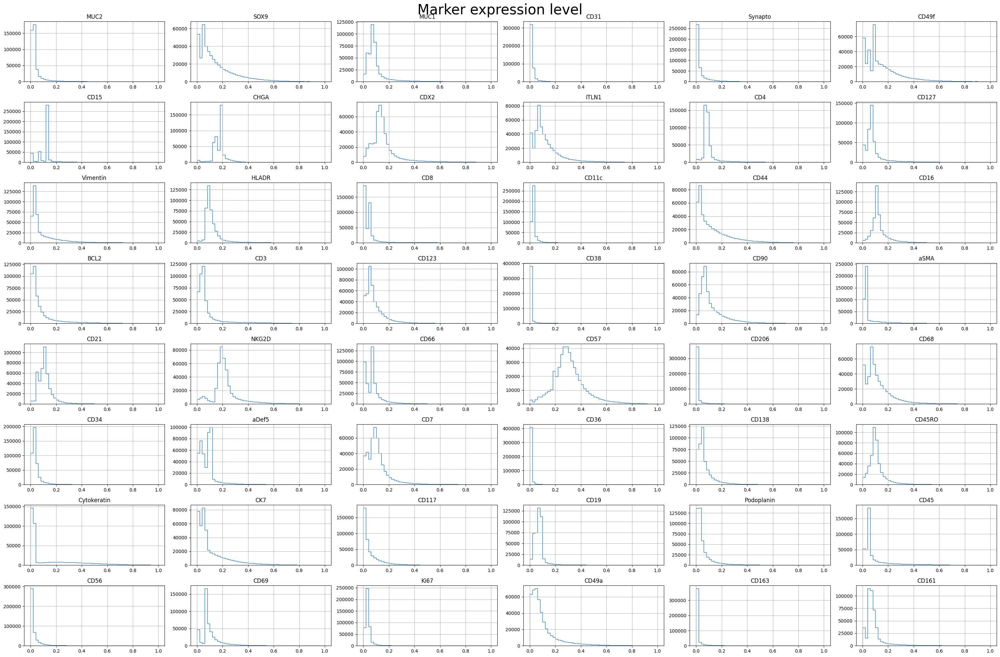

KeyError: 'cell_type_upperlevel'

In [53]:
marker_expression(sample_data_scale[cols], markers=None, save=False, fname=None, dpi='figure', log=False)

label = {'Global': sample_data_scale['cell_type_upperlevel']}
label = pd.DataFrame(label)
marker_expression_by_cell_type(sample_data_scale[cols], label, cell_types=None, markers=None, level="Global", save=False, fname=None, dpi='figure', log=False)

<Axes: >

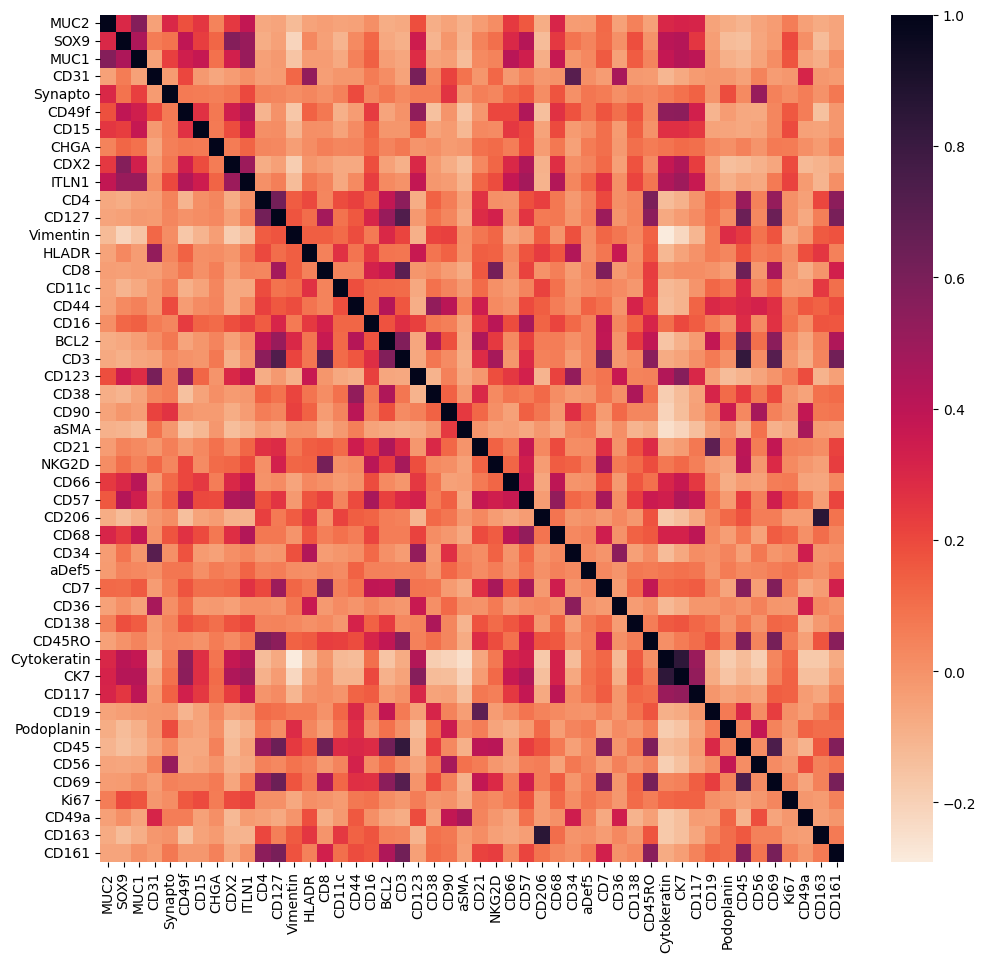

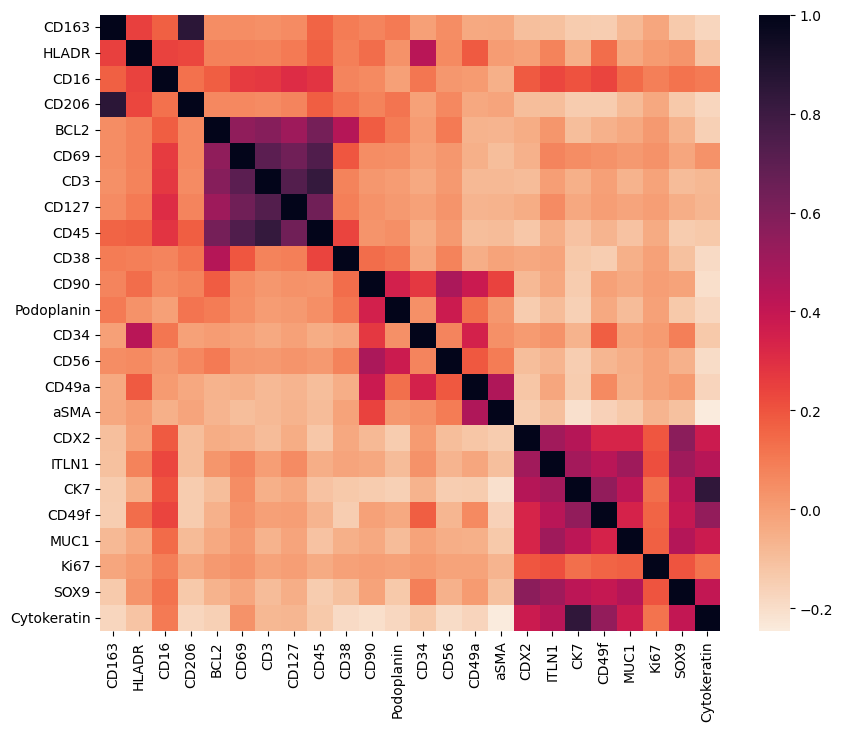

In [54]:
plt.figure(figsize=(12, 11))
sns.heatmap(sample_data_scale[cols].corr(),cmap=sns.cm.rocket_r)

# check the marker correlation matrix we choose for the clustering method
df = pd.ExcelFile(r"C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_cl.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)
marker_df = sample_data_scale[logic["Global"]["Epithelial"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [55]:
# save the processed dataset
sample_data_scale.to_csv("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_0056_scaled.csv")

## Marker quality check (unprocessed dataset)

In [ ]:
# read input files
sample_data = pd.read_csv(r'C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL.csv',low_memory=False)
sample_data = sample_data.drop(["...1", "x","y","tissue","cell_type_A","donor","unique_region","cell_type_upperlevel"], axis=1)

In [ ]:
# Plot marker histograms after filter with 99% percentiles
markers = sample_data.columns.values

fig, axs = plt.subplots(math.ceil(len(markers) / 6), 6, figsize=(30, 20))
fig.suptitle("Original Marker expression level", fontsize=30)
for i in range(len(markers)): 
    ax = axs[i//6, i%6]
    plt.sca(ax)
    hist, edges = np.histogram(sample_data[markers[i]][sample_data[markers[i]] < np.percentile(sample_data[markers[i]],99)], bins=50)
    plt.stairs(hist, edges, label="{}".format(markers[i]))
    plt.title(f"{markers[i]}")
    plt.grid()
    plt.tight_layout()
plt.show()

In [ ]:
# Plot log transformed marker histograms after filter with 99% percentiles
sample_data_log = np.log(sample_data + abs(np.min(sample_data)) + sys.float_info.epsilon)
# sample_data_scaled = (sample_data_log - np.mean(sample_data_log)) / (np.std(sample_data_log))
# sample_data_norm = (sample_data_log - np.min(sample_data_log))/(np.max(sample_data_log) - np.min(sample_data_log))

fig, axs = plt.subplots(math.ceil(len(markers) / 6), 6, figsize=(30, 20))
fig.suptitle("Log-transformed Marker expression level filter with 99 percentile", fontsize=30)
for i in range(len(markers)-1): 
    ax = axs[i//6, i%6]
    plt.sca(ax)
    hist, edges = np.histogram(sample_data_log[markers[i]][sample_data_log[markers[i]] < np.percentile(sample_data_log[markers[i]],99)], 
                               bins=50)
    plt.stairs(hist, edges, label="{}".format(markers[i]))
    plt.title(f"{markers[i]}")
    plt.grid()
    plt.tight_layout()
plt.show()

In [ ]:
# Plot marker expression histogram for each level 1 cell types
markers = sample_data.columns.values
sample_data_labeled = pd.read_csv(r'C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel.csv',low_memory=False)
upper_celltype = np.unique(sample_data_labeled["cell_type_upperlevel"])
sample_data_log = np.log(sample_data + abs(np.min(sample_data)) + sys.float_info.epsilon)
sample_data_labeled_plot = sample_data_log.assign(cell_type_upperlevel=sample_data_labeled["cell_type_upperlevel"])

fig, axs = plt.subplots(math.ceil(len(markers) / 6), 6, figsize=(30, 20))
fig.suptitle("Log-transformed Marker expression level per cell type", fontsize=30)

for i in range(len(markers)): 
    ax = axs[i//6, i%6]
    plt.sca(ax)
    for uc in upper_celltype: 
        subset = sample_data_labeled_plot.loc[sample_data_labeled_plot["cell_type_upperlevel"]==uc]
        hist, edges = np.histogram(subset[markers[i]][subset[markers[i]] < np.percentile(subset[markers[i]],99)], bins=50)
        plt.stairs(hist, edges, label="{}".format(uc))
        plt.legend(loc='upper right')
    plt.title(f"{markers[i]}")
    plt.grid()
    plt.tight_layout()
plt.show()


In [ ]:
marker_df = sample_data.drop(["x","y","tissue","cell_type_A","donor","unique_region","cell_type_upperlevel"], axis=1)
plt.figure(figsize=(12, 11))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

# Run tribus on processed CL dataset

In [13]:
# read input files
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL_scaled.csv',low_memory=False)
df = pd.ExcelFile("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_cl.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)

<Axes: >

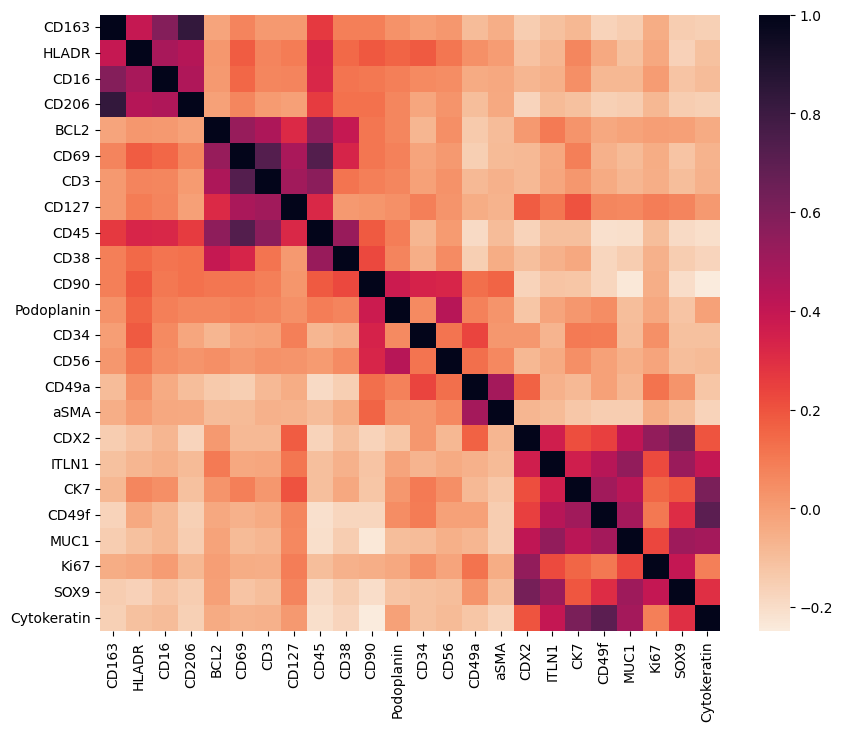

In [14]:
# check the marker correlation matrix we choose for the clustering method
marker_df = sample_data[logic["Global"]["Epithelial"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [15]:
# Run Tribus on z-scored dataset
depth = 2
labels, scores = run_tribus(sample_data, logic, depth=depth, normalization=z_score) # modify depth
# 20min for 456688 cells

Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
2.7607192118962605 minutes


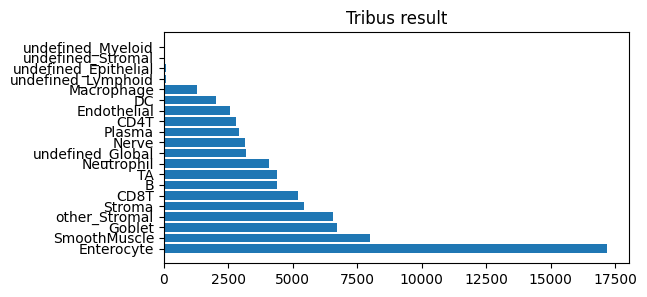

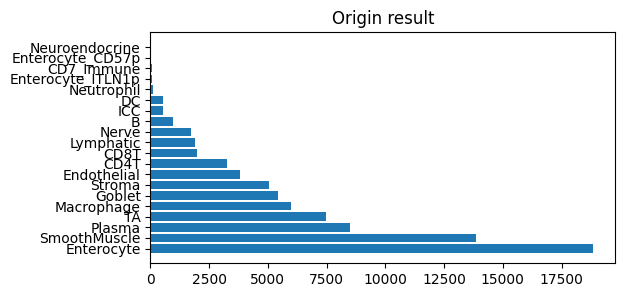

In [16]:
if depth == 1: 
    label_stat = labels["final_label"].value_counts().rename_axis('final_label').reset_index(name='count')
    name = label_stat['final_label']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Tribus result')
    ax.barh(name, num)

    label_stat = pd.DataFrame({'Group': sample_data['cell_type_upperlevel']})["Group"].value_counts().rename_axis('Group').reset_index(name='count')
    name = label_stat['Group']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Origin result')
    ax.barh(name, num)
else: 
    label_stat = labels["final_label"].value_counts().rename_axis('final_label').reset_index(name='count')
    name = label_stat['final_label']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Tribus result')
    ax.barh(name, num)

    label_stat = pd.DataFrame({'Group': sample_data['cell_type_A']})["Group"].value_counts().rename_axis('Group').reset_index(name='count')
    name = label_stat['Group']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Origin result')
    ax.barh(name, num)

<BarContainer object of 4 artists>

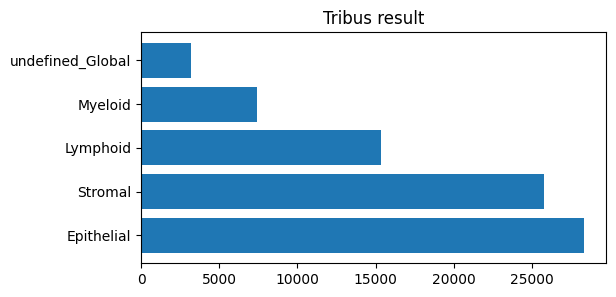

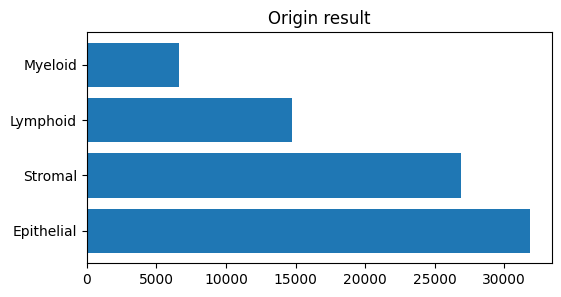

In [17]:
label_stat = labels["Global"].value_counts().rename_axis('final_label').reset_index(name='count')
name = label_stat['final_label']
num = label_stat['count']
fig, ax = plt.subplots(figsize =(6, 3))
plt.title('Tribus result')
ax.barh(name, num)

label_stat = pd.DataFrame({'Group': sample_data['cell_type_upperlevel']})["Group"].value_counts().rename_axis('Group').reset_index(name='count')
name = label_stat['Group']
num = label_stat['count']
fig, ax = plt.subplots(figsize =(6, 3))
plt.title('Origin result')
ax.barh(name, num)

             Epithelial  Lymphoid   Myeloid       Stromal
CD163          0.005156  0.015340  0.197493  6.057479e-03
HLADR          0.034951  0.044545  0.189845  3.799350e-02
CD16           0.019737  0.026587  0.107308  1.586952e-02
CD206          0.002566  0.007658  0.226286  2.244870e-03
BCL2           0.034655  0.178178  0.009320  1.073739e-02
CD69           0.013777  0.157696  0.036806  5.119942e-03
CD3            0.013626  0.080537  0.014413  1.094007e-02
CD127          0.071785  0.077149  0.045737  4.597388e-02
CD45           0.002827  0.259101  0.141424  5.467224e-04
CD38           0.000108  0.083140  0.009885  8.701766e-07
CD90           0.007368  0.070851  0.060805  7.489285e-02
Podoplanin     0.017190  0.037731  0.030583  3.037726e-02
CD34           0.026661  0.022736  0.019566  4.631146e-02
CD56           0.021890  0.014987  0.014857  3.025352e-02
CD49a          0.081602  0.038570  0.042029  1.900813e-01
aSMA           0.000104  0.000609  0.000198  1.590148e-02
CDX2          

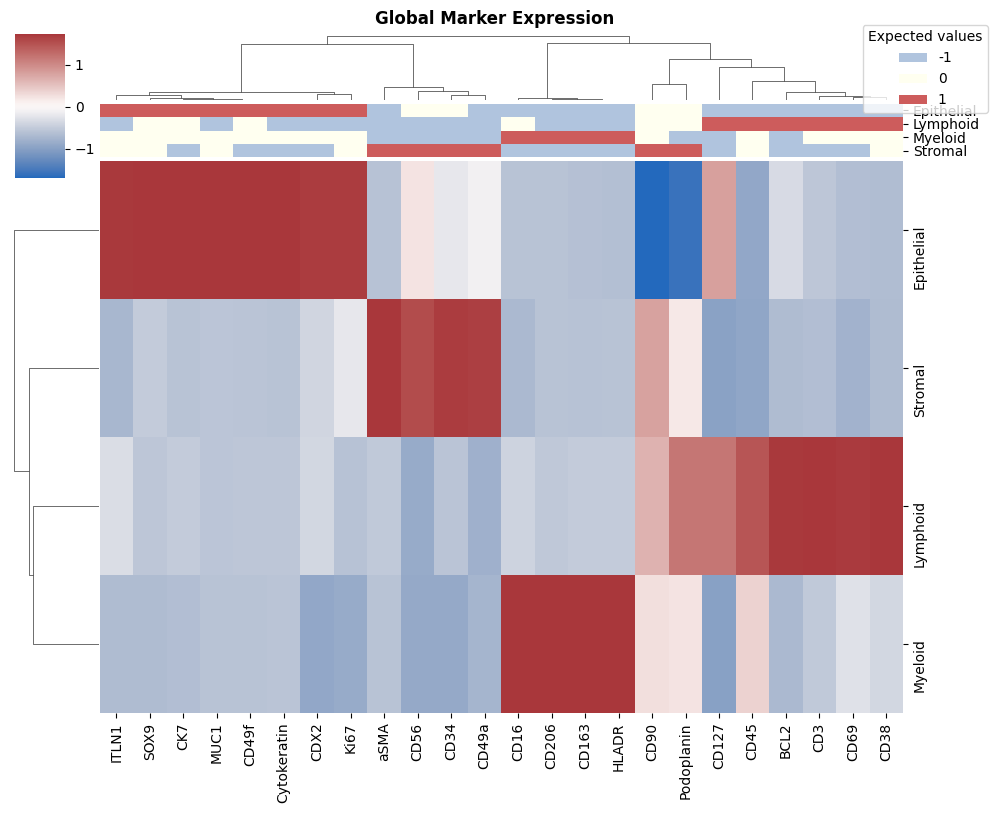

                   DC  Macrophage  Neutrophil
CD11c        0.309100    0.040656    0.037266
Cytokeratin  0.001546    0.000250    0.001825
CD206        0.165402    0.563839    0.196859
CD163        0.169286    0.495753    0.163396
CD16         0.148826    0.296946    0.071417
CD15         0.000585    0.000003    0.000611
CD66         0.006383    0.001431    0.004135


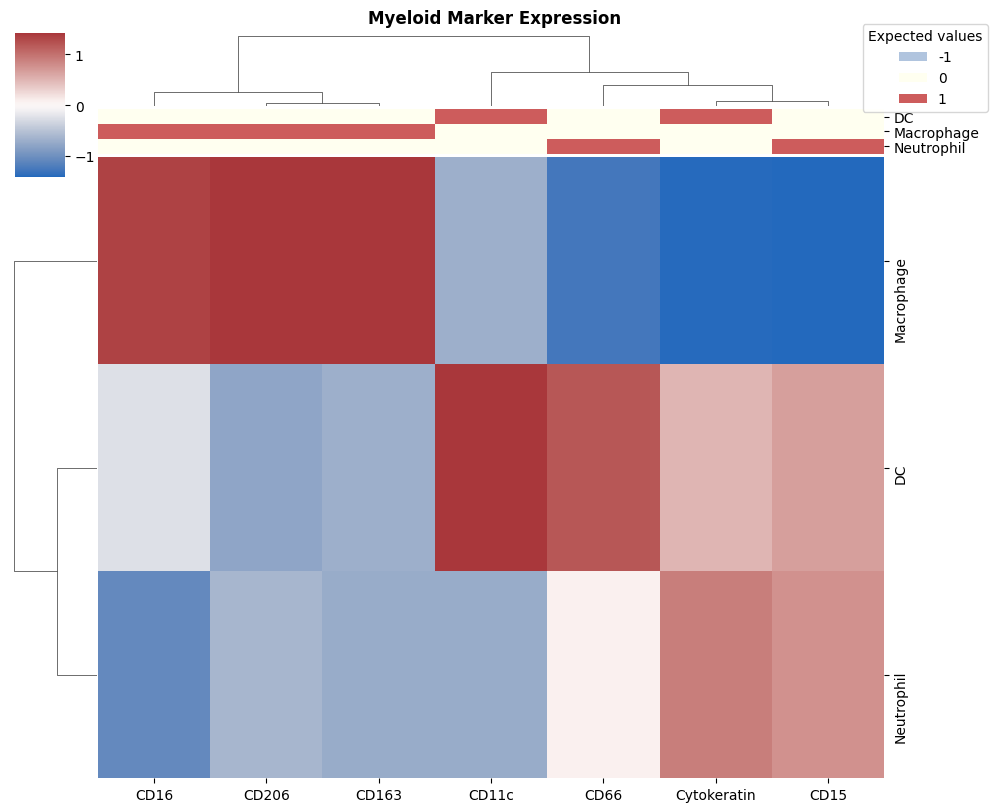

              B      CD4T      CD8T    Plasma
CD21   0.243415  0.080171  0.047935  0.114993
CD19   0.324287  0.029332  0.010642  0.135890
CD4    0.072314  0.396013  0.027737  0.030757
CD3    0.060230  0.355497  0.084746  0.035280
CD8    0.017890  0.010045  0.028418  0.009765
CD38   0.193785  0.010656  0.008786  0.473385
CD138  0.053223  0.005123  0.017297  0.368865
aSMA   0.001000  0.000388  0.000144  0.002075


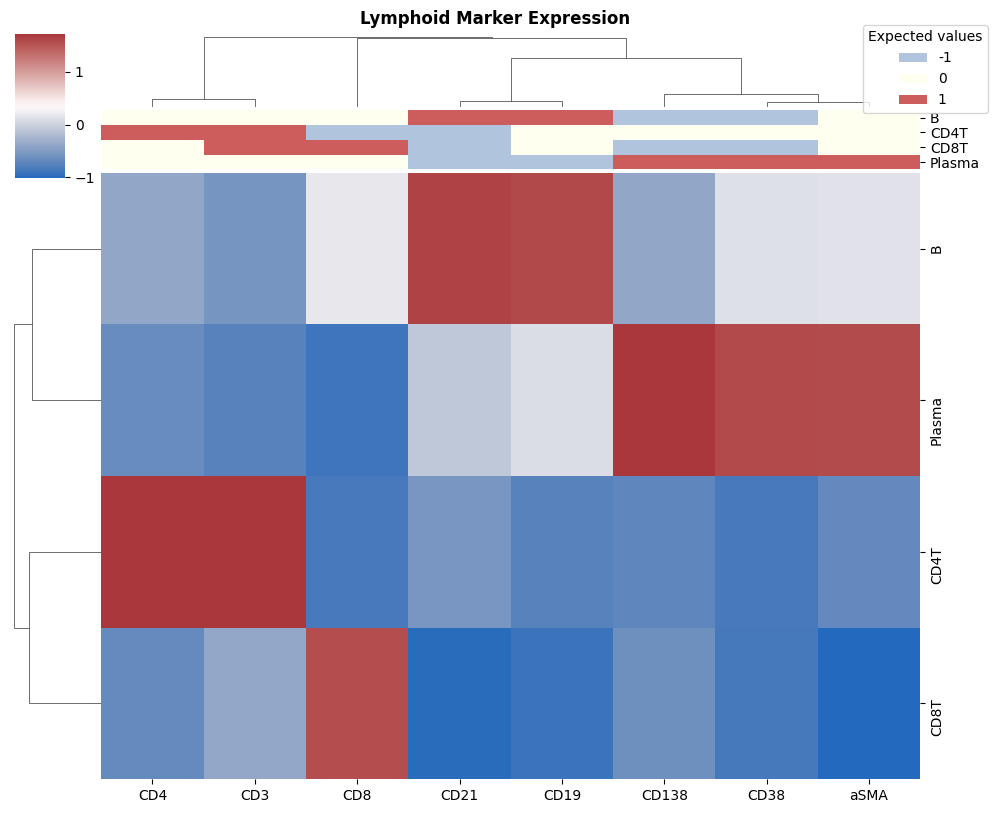

          Endothelial     Nerve  SmoothMuscle        Stroma
Vimentin     0.055249  0.050190      0.007450  2.643953e-01
aSMA         0.017161  0.000906      0.143054  5.873298e-05
MUC2         0.000191  0.000047      0.027638  9.905371e-07
CHGA         0.018734  0.021042      0.072389  1.625938e-02
CD56         0.060824  0.355965      0.024072  1.291294e-02
Synapto      0.012520  0.194353      0.012572  4.001079e-03
CD36         0.234658  0.005107      0.006127  4.373301e-03
CD31         0.361934  0.001629      0.001248  1.575584e-03


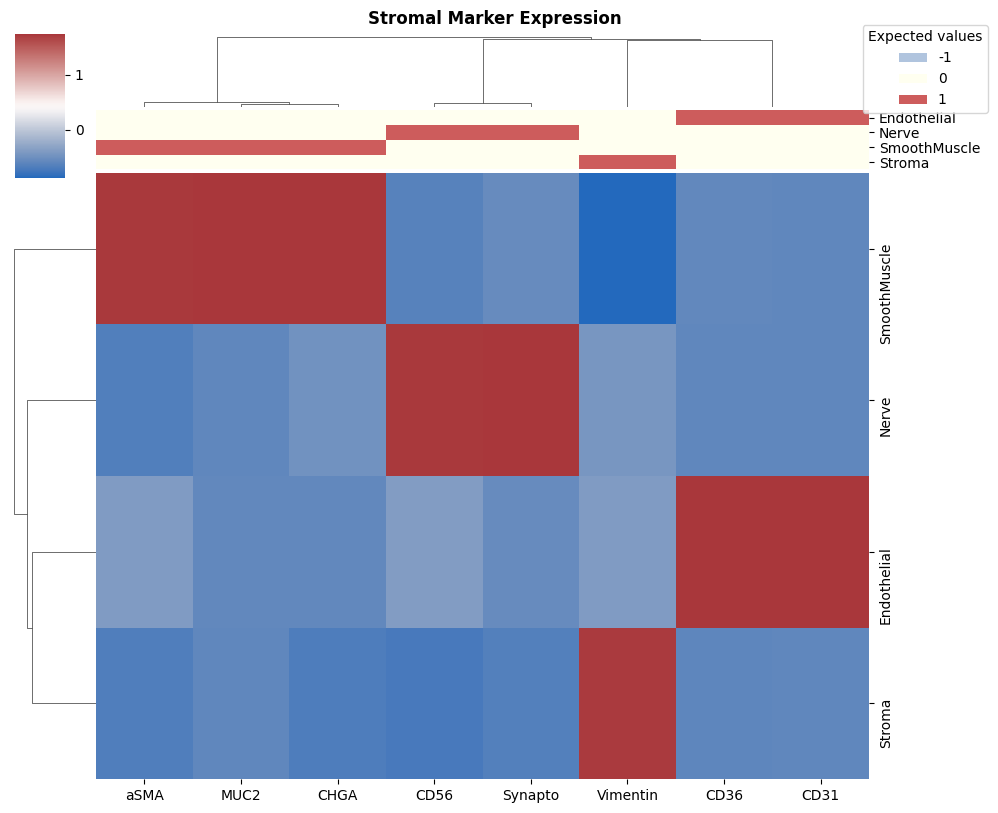

            Enterocyte    Goblet        TA
Ki67          0.049463  0.075125  0.207197
CDX2          0.130754  0.243471  0.376077
SOX9          0.069065  0.288210  0.463133
MUC2          0.000227  0.313526  0.058372
CD49f         0.309934  0.157212  0.172701
Podoplanin    0.029704  0.009839  0.008351


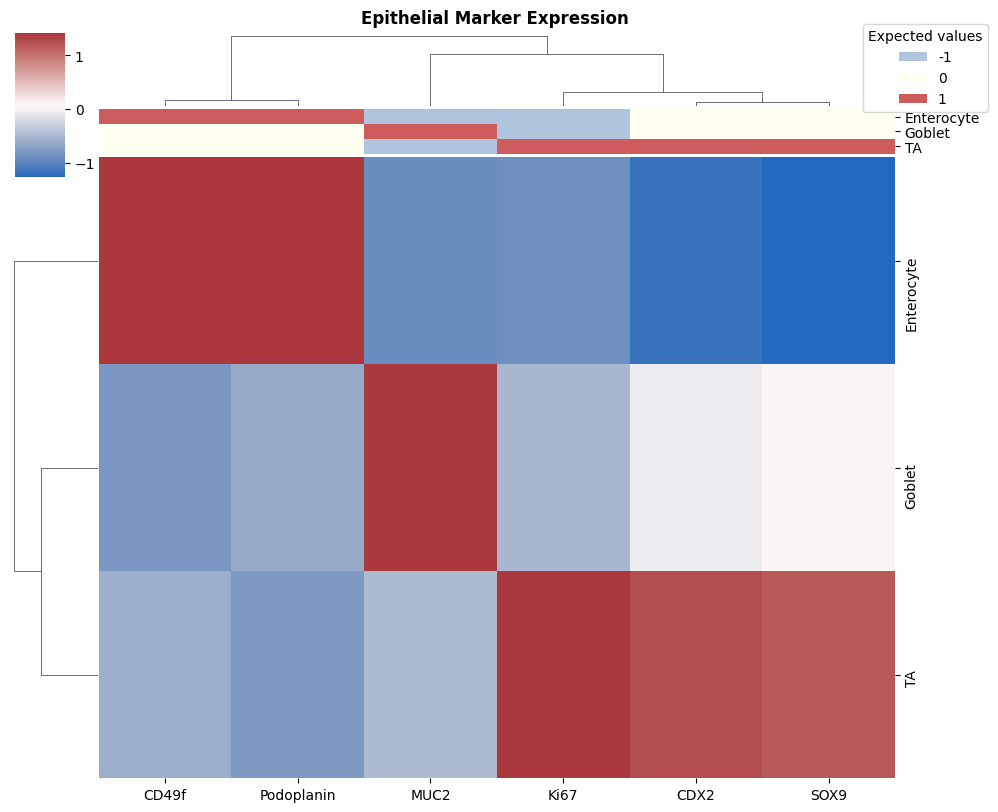

In [18]:
for i in labels.columns.values.tolist()[ : -1]: 
    heatmap_for_median_expression(sample_data, labels, logic, level=i, save=False, fname=None,
                                    dpi='figure', transform=z_score, title="{} Marker Expression".format(i),
                                    c_palette=sns.color_palette(['lightsteelblue', 'ivory', 'indianred'], 3),
                                    cmap_='vlag', dendrogram_ratio_=0.1)

C:\Users\Localadmin_kangzigi\AppData\Local\Temp\ipykernel_21228\2639141574.py:46: RuntimeWarning: invalid value encountered in true_divide
  cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.8813827117050891, Accuracy score = 0.5299973768689809, Precision score = 0.7350035811731064, F1 score = 0.5764121811705772


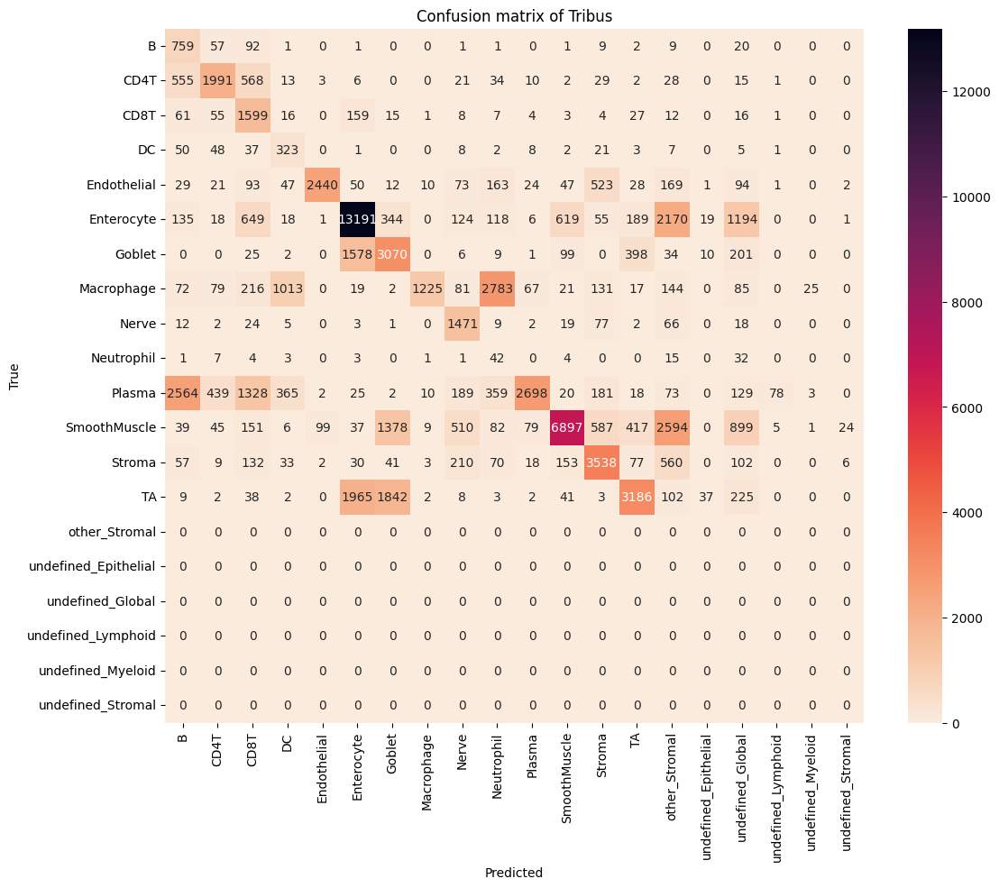

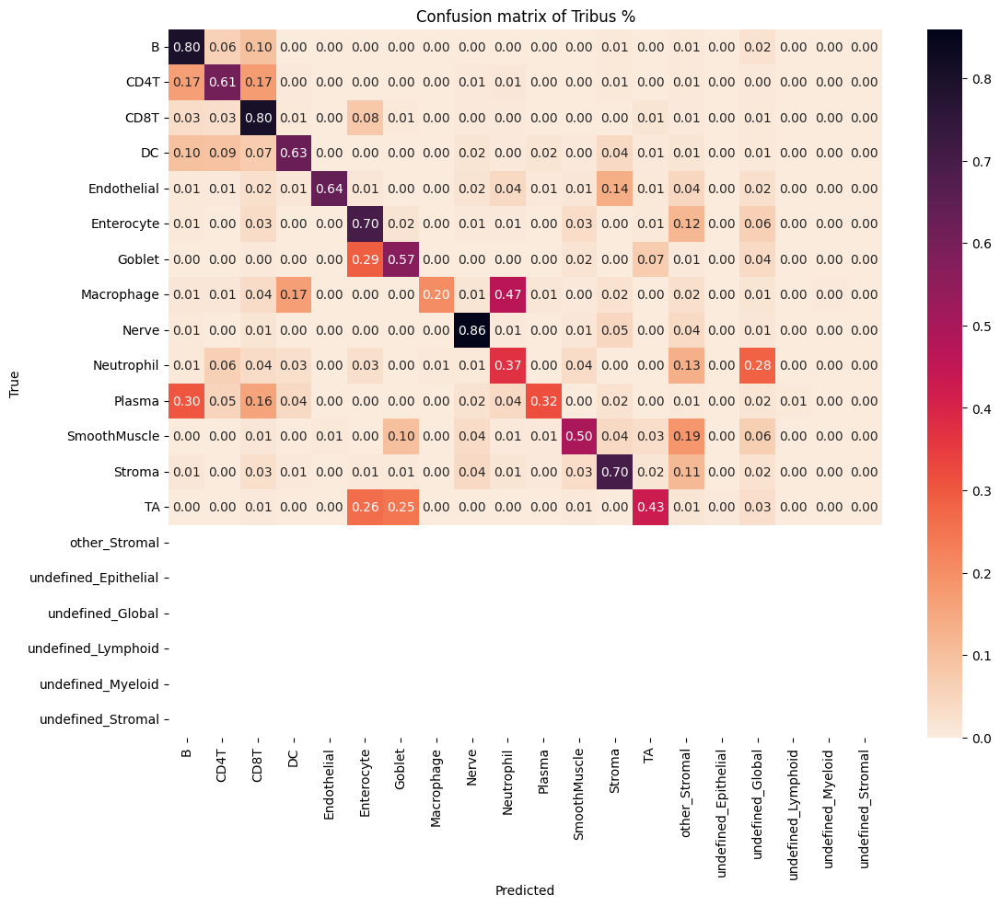

In [19]:
# confusion matrix
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.unique(labels["final_label"])
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_true = [element.replace('Lymphatic', 'Lympatic') for element in celltype_true]
    celltype_true = [element.replace('CD7_Immune', 'CD7_immune') for element in celltype_true]
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.unique(labels["final_label"])
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

C:\Users\Localadmin_kangzigi\AppData\Local\Temp\ipykernel_21228\3416899189.py:18: RuntimeWarning: invalid value encountered in true_divide
  cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


Rand score = 0.8343194757486665, Accuracy score = 0.8204029628889417, Precision score = 0.8580430920968768, F1 score = 0.8376678314685068


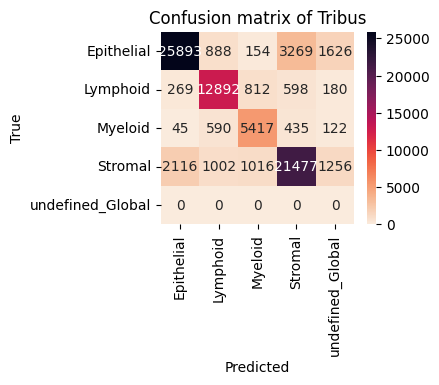

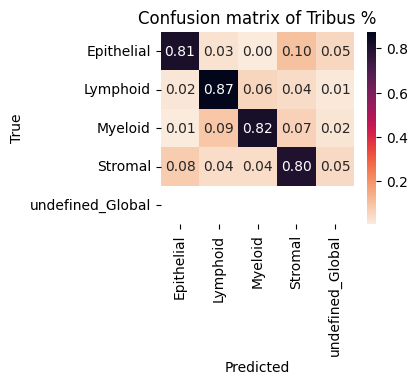

In [20]:
# confusion matrix for first level
celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
celltype_pred = np.array(labels["Global"]).tolist()
cm_labels = np.unique(labels["Global"])
cm = confusion_matrix(celltype_true, 
                      celltype_pred, 
                      labels = cm_labels)
                                                       
df_cm = pd.DataFrame(cm, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus')
plt.xlabel('Predicted')
plt.ylabel('True')


cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cmn = pd.DataFrame(cmn, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus %')
plt.xlabel('Predicted')
plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

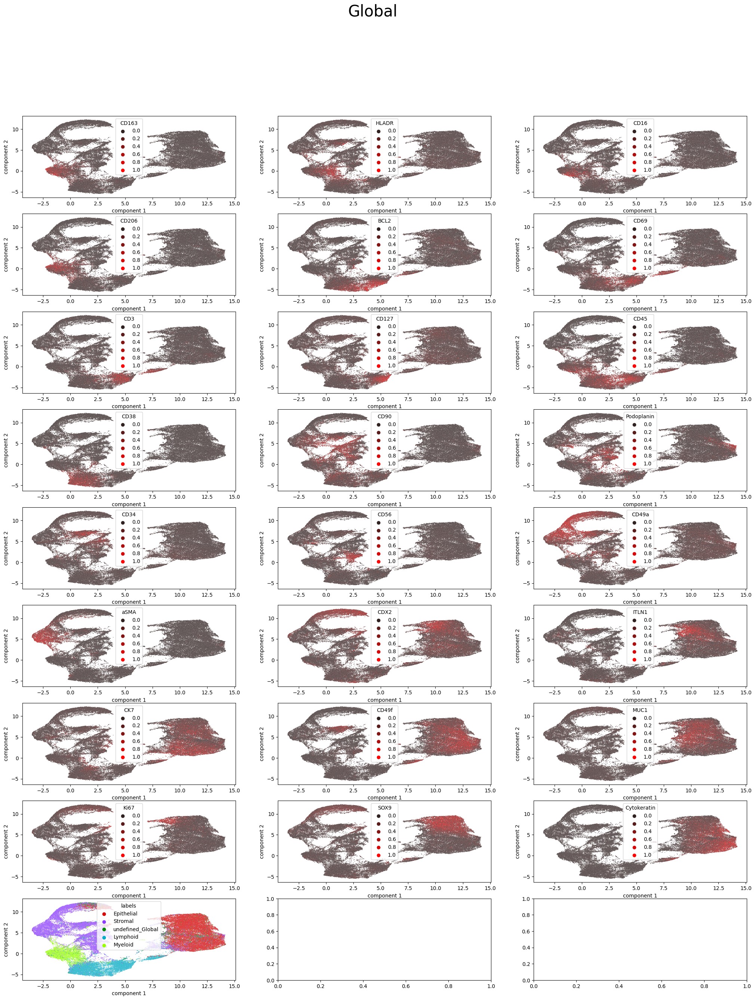

In [21]:
umap_vis(sample_data, labels, markers=logic["Global"].index.values.tolist(), save=False, fname=None,  level="Global", title=None, init='spectral',
             random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation', palette_markers='mycolormap',
             palette_cell='tab10', dpi='figure')

In [10]:
labels.to_csv(r"C:\Users\Public\Farkkila_lab_datasets\Tribus\Test_case_data\STELLAR\output_data\STELLAR_celltyping_cl_filtered_v1.csv")

# Run tribus on processed SB dataset

In [2]:
# read input files
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_SB_scaled.csv',low_memory=False)
df = pd.ExcelFile("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_cl.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)

<Axes: >

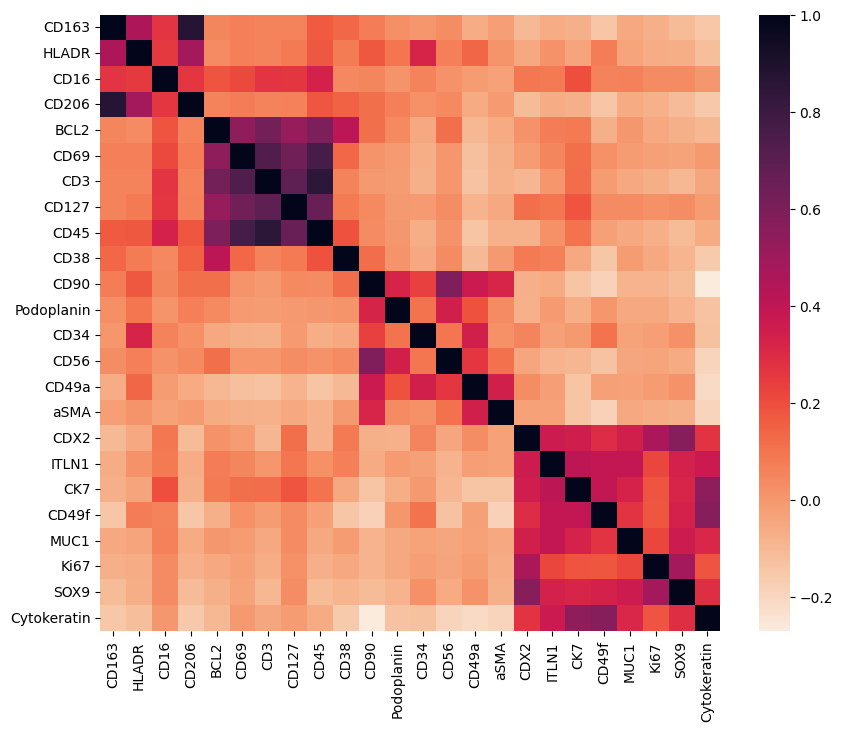

In [3]:
# check the marker correlation matrix we choose for the clustering method
marker_df = sample_data[logic["Global"]["Epithelial"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [5]:
# Run Tribus on z-scored dataset
depth = 2
labels, scores = run_tribus(sample_data, logic, depth=depth, normalization=z_score) # modify depth
# 20min for 456688 cells

Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
3.189710772037506 minutes


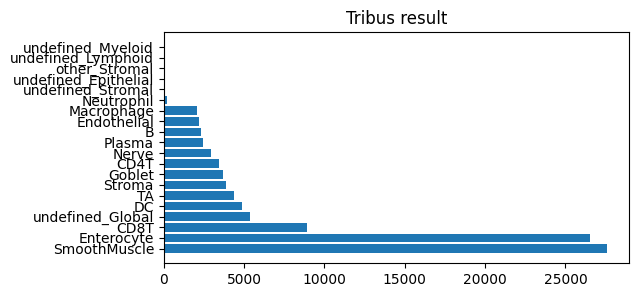

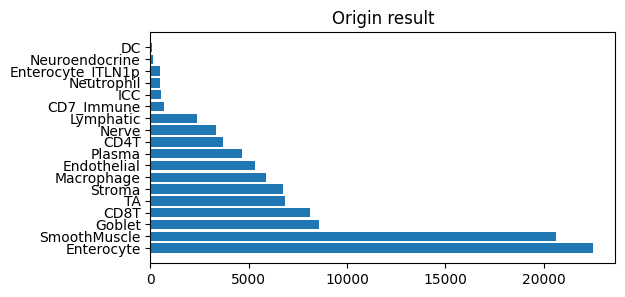

In [6]:
if depth == 1: 
    label_stat = labels["final_label"].value_counts().rename_axis('final_label').reset_index(name='count')
    name = label_stat['final_label']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Tribus result')
    ax.barh(name, num)

    label_stat = pd.DataFrame({'Group': sample_data['cell_type_upperlevel']})["Group"].value_counts().rename_axis('Group').reset_index(name='count')
    name = label_stat['Group']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Origin result')
    ax.barh(name, num)
else: 
    label_stat = labels["final_label"].value_counts().rename_axis('final_label').reset_index(name='count')
    name = label_stat['final_label']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Tribus result')
    ax.barh(name, num)

    label_stat = pd.DataFrame({'Group': sample_data['cell_type_A']})["Group"].value_counts().rename_axis('Group').reset_index(name='count')
    name = label_stat['Group']
    num = label_stat['count']
    fig, ax = plt.subplots(figsize =(6, 3))
    plt.title('Origin result')
    ax.barh(name, num)

<BarContainer object of 4 artists>

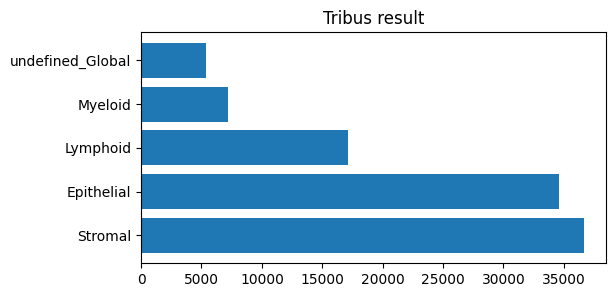

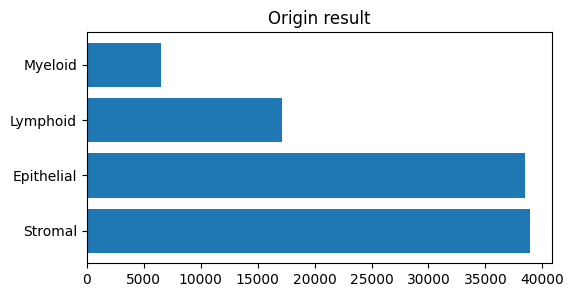

In [7]:
label_stat = labels["Global"].value_counts().rename_axis('final_label').reset_index(name='count')
name = label_stat['final_label']
num = label_stat['count']
fig, ax = plt.subplots(figsize =(6, 3))
plt.title('Tribus result')
ax.barh(name, num)

label_stat = pd.DataFrame({'Group': sample_data['cell_type_upperlevel']})["Group"].value_counts().rename_axis('Group').reset_index(name='count')
name = label_stat['Group']
num = label_stat['count']
fig, ax = plt.subplots(figsize =(6, 3))
plt.title('Origin result')
ax.barh(name, num)

             Epithelial  Lymphoid   Myeloid   Stromal
CD163          0.003342  0.006541  0.256956  0.002361
HLADR          0.017388  0.020399  0.149990  0.013646
CD16           0.038536  0.048684  0.068731  0.021943
CD206          0.001330  0.004012  0.253856  0.000934
BCL2           0.010176  0.182243  0.006375  0.007839
CD69           0.005738  0.127990  0.005552  0.001514
CD3            0.003765  0.184969  0.001850  0.000991
CD127          0.046646  0.119967  0.028895  0.026501
CD45           0.000862  0.203401  0.060615  0.000090
CD38           0.000060  0.015793  0.004235  0.000029
CD90           0.000939  0.021507  0.045229  0.073681
Podoplanin     0.004409  0.008866  0.013068  0.018439
CD34           0.017786  0.013667  0.011395  0.019222
CD56           0.004091  0.010309  0.007988  0.028990
CD49a          0.038089  0.028065  0.028419  0.182394
aSMA           0.000011  0.000120  0.000163  0.006611
CDX2           0.184346  0.084949  0.052556  0.100733
ITLN1          0.102958  0.0

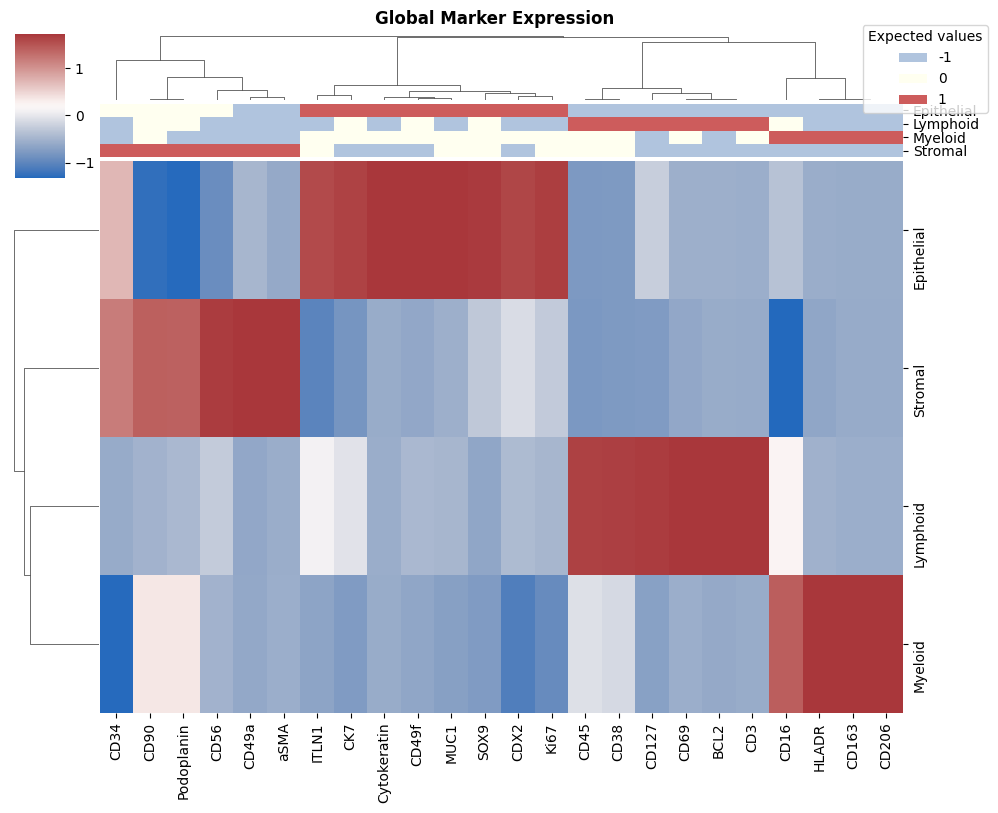

                   DC  Macrophage    Neutrophil
CD11c        0.037925    0.023677  1.930355e-02
Cytokeratin  0.000385    0.000214  2.470657e-07
CD206        0.178360    0.506325  1.057476e-03
CD163        0.179455    0.555762  3.569592e-03
CD16         0.054114    0.102467  4.731857e-01
CD15         0.000006    0.000005  5.037405e-01
CD66         0.009259    0.007427  3.450426e-01


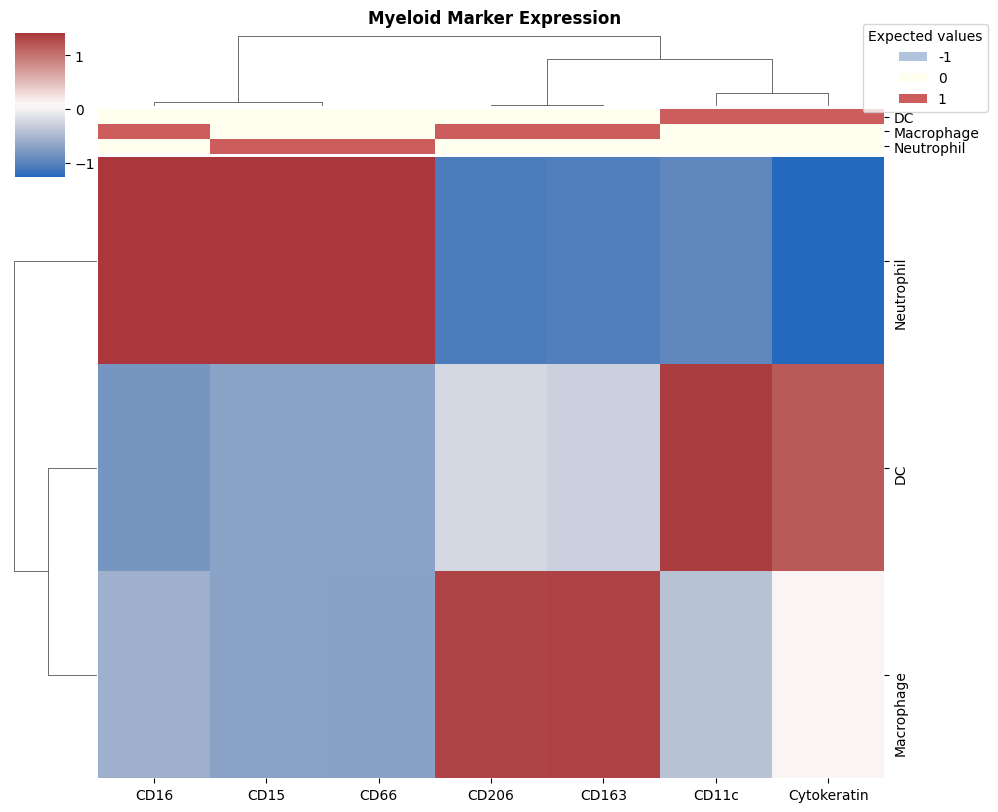

              B      CD4T      CD8T    Plasma
CD21   0.370023  0.094123  0.075985  0.145410
CD19   0.254305  0.005111  0.003855  0.008026
CD4    0.024852  0.442421  0.011826  0.014387
CD3    0.022110  0.343258  0.247597  0.004885
CD8    0.008158  0.006487  0.189640  0.005034
CD38   0.251392  0.011435  0.001468  0.499210
CD138  0.067475  0.005921  0.012595  0.385653
aSMA   0.000318  0.000229  0.000054  0.000400


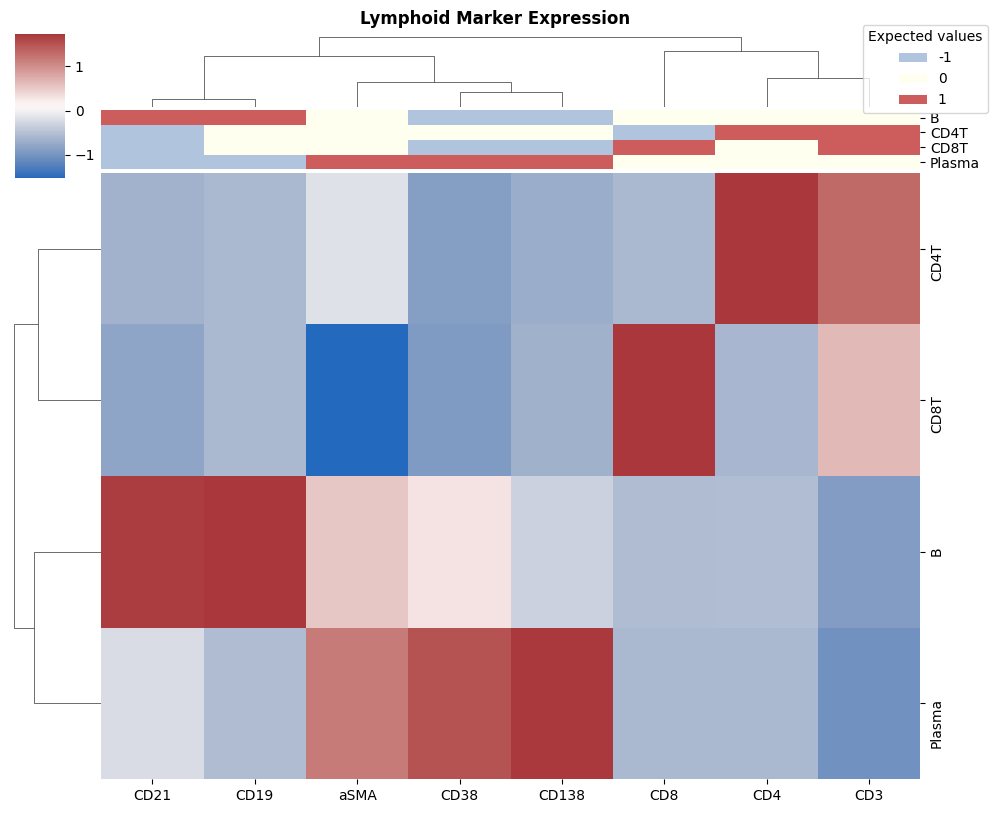

          Endothelial     Nerve  SmoothMuscle    Stroma
Vimentin     0.072467  0.089445      0.004686  0.411830
aSMA         0.006772  0.000482      0.018220  0.000128
MUC2         0.000160  0.000280      0.001059  0.000072
CHGA         0.006005  0.003822      0.004593  0.002752
CD56         0.044495  0.379128      0.025143  0.006932
Synapto      0.008211  0.348734      0.002262  0.001571
CD36         0.331410  0.002325      0.001498  0.001356
CD31         0.389465  0.000890      0.000717  0.000681


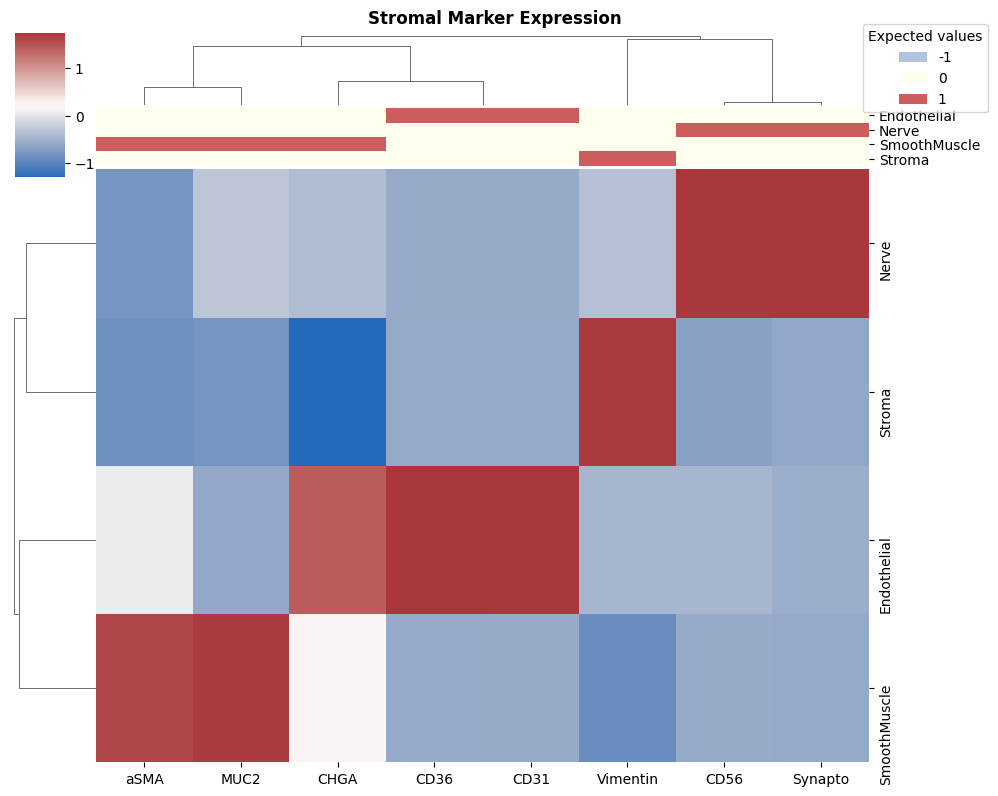

            Enterocyte    Goblet        TA
Ki67          0.037422  0.057619  0.445595
CDX2          0.163593  0.200563  0.376420
SOX9          0.109554  0.218279  0.407411
MUC2          0.000218  0.435779  0.013930
CD49f         0.248959  0.189556  0.214648
Podoplanin    0.004544  0.003972  0.004108


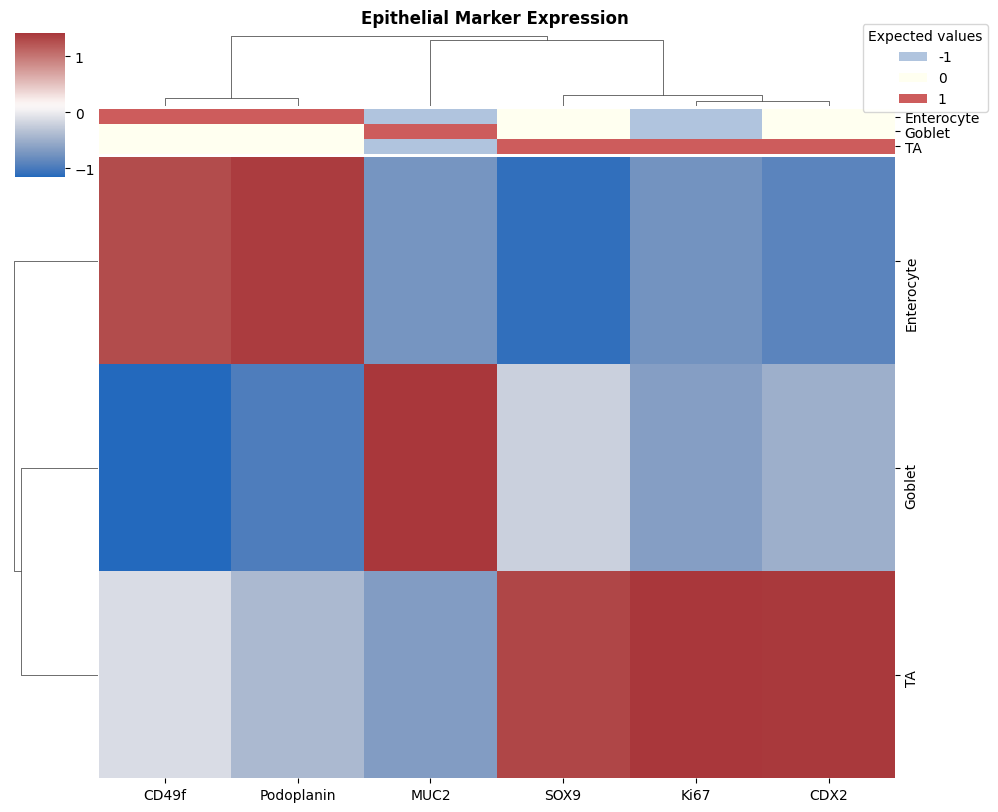

In [8]:
for i in labels.columns.values.tolist()[ : -1]: 
    heatmap_for_median_expression(sample_data, labels, logic, level=i, save=False, fname=None,
                                    dpi='figure', transform=z_score, title="{} Marker Expression".format(i),
                                    c_palette=sns.color_palette(['lightsteelblue', 'ivory', 'indianred'], 3),
                                    cmap_='vlag', dendrogram_ratio_=0.1)

C:\Users\Localadmin_kangzigi\AppData\Local\Temp\ipykernel_21228\2639141574.py:46: RuntimeWarning: invalid value encountered in true_divide
  cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.8682867691237294, Accuracy score = 0.6233600348539008, Precision score = 0.7159448910921611, F1 score = 0.6335396345772548


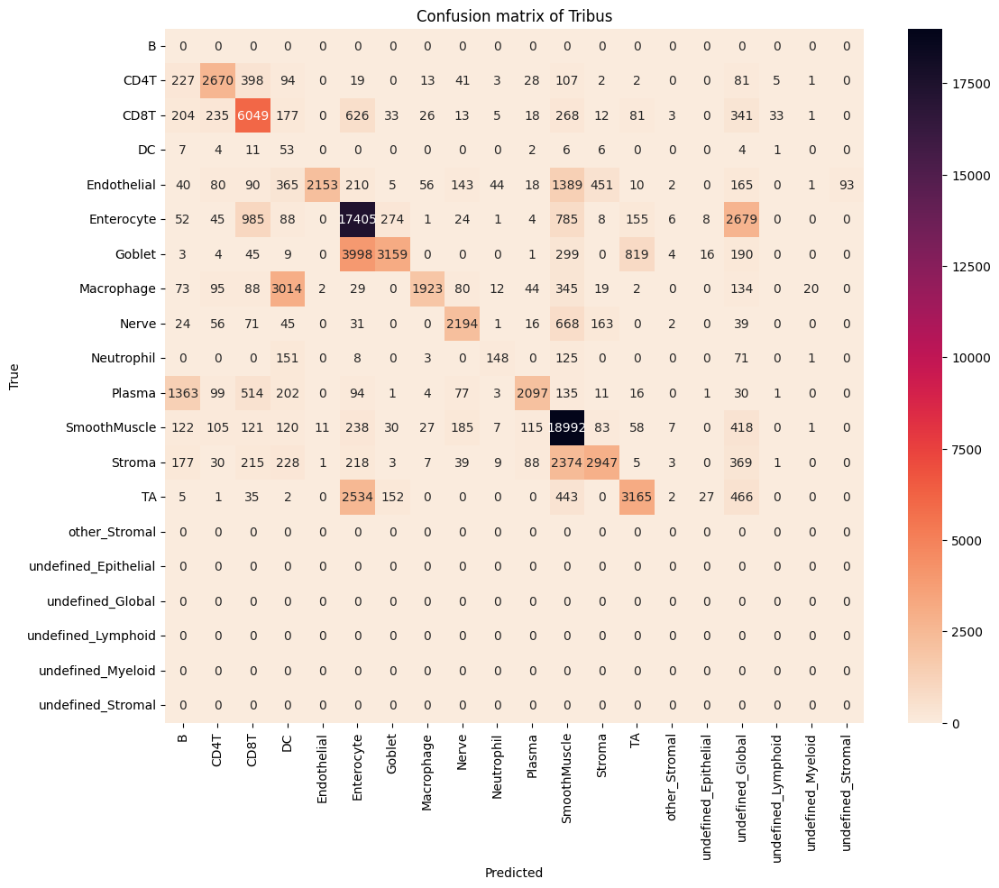

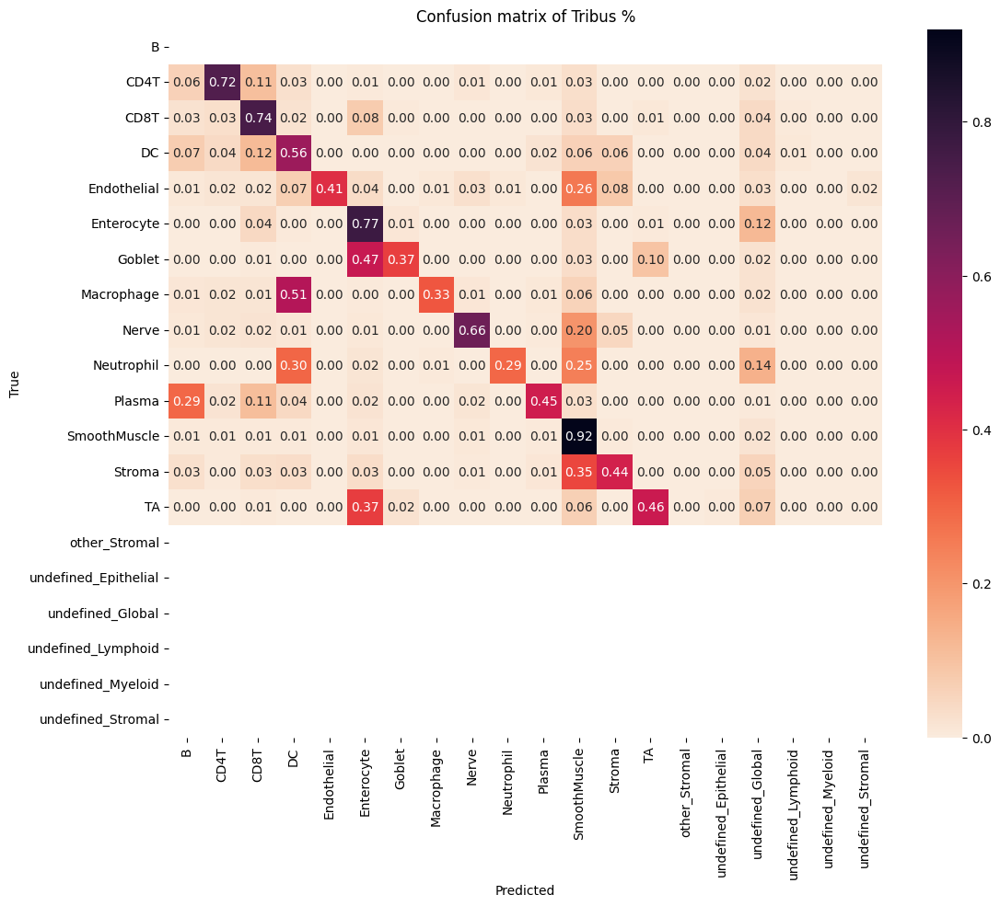

In [9]:
# confusion matrix
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.unique(labels["final_label"])
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_true = [element.replace('Lymphatic', 'Lympatic') for element in celltype_true]
    celltype_true = [element.replace('CD7_Immune', 'CD7_immune') for element in celltype_true]
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.unique(labels["final_label"])
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

C:\Users\Localadmin_kangzigi\AppData\Local\Temp\ipykernel_21228\3416899189.py:18: RuntimeWarning: invalid value encountered in true_divide
  cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


Rand score = 0.8659547053117423, Accuracy score = 0.8477716277365758, Precision score = 0.8983836879574395, F1 score = 0.8716980269882351


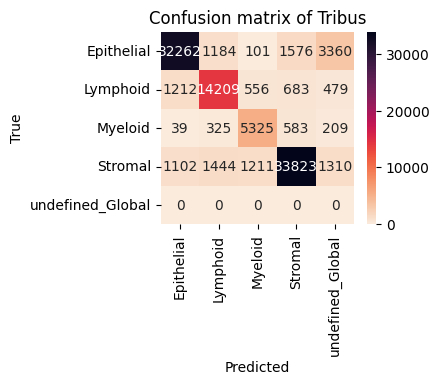

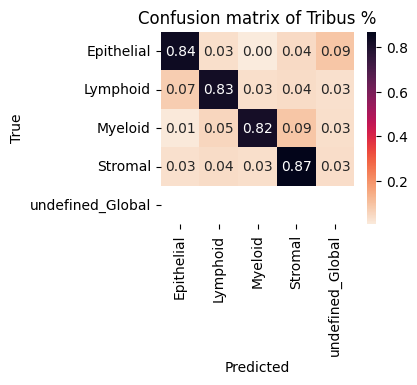

In [10]:
# confusion matrix for first level
celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
celltype_pred = np.array(labels["Global"]).tolist()
cm_labels = np.unique(labels["Global"])
cm = confusion_matrix(celltype_true, 
                      celltype_pred, 
                      labels = cm_labels)
                                                       
df_cm = pd.DataFrame(cm, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus')
plt.xlabel('Predicted')
plt.ylabel('True')


cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cmn = pd.DataFrame(cmn, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus %')
plt.xlabel('Predicted')
plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

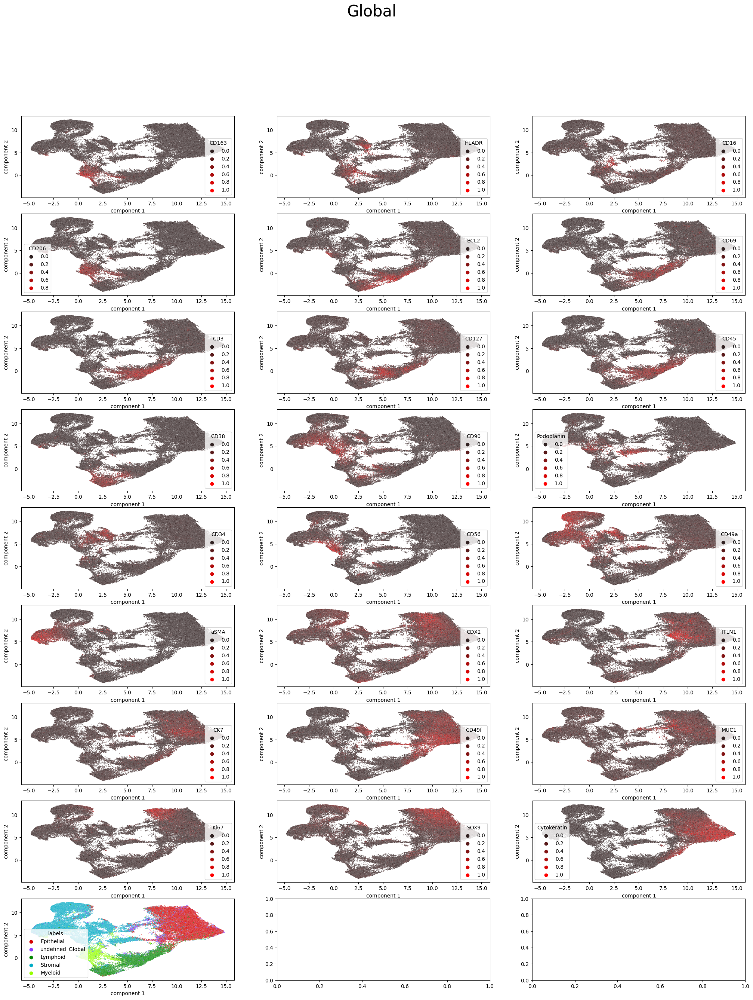

In [11]:
umap_vis(sample_data, labels, markers=logic["Global"].index.values.tolist(), save=False, fname=None,  level="Global", title=None, init='spectral',
             random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation', palette_markers='mycolormap',
             palette_cell='tab10', dpi='figure')

In [12]:
labels.to_csv(r"C:\Users\Public\Farkkila_lab_datasets\Tribus\Test_case_data\STELLAR\output_data\STELLAR_celltyping_sb_filtered_v1.csv")